#Install libraries

In [ ]:
!pip install numpy
!pip install albumentations
!pip install Pillow
!pip install opencv-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Import libraries and necessary componets

In [ ]:
from PIL import Image
import numpy as np
import albumentations as A
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow

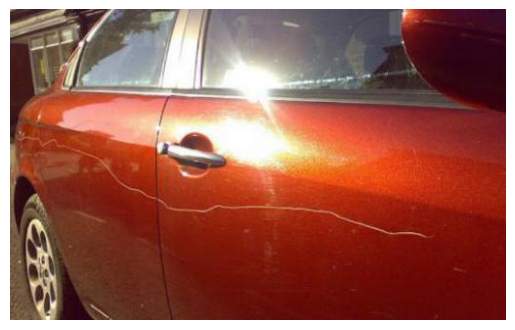

In [ ]:
img = cv2.imread('/content/drive/MyDrive/DamagedVehicleImages/train/images/slightly-scratch--78-_jpg.rf.486ddc2771fa2cd973bf8879e74a9fbe.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.axis('off')
plt.show()

#Function to display original and transformed image

In [ ]:
def display_images_side_by_side(original_image, transformed_image):
  
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    axs[0].imshow(original_image)
    axs[0].set_title("Original Image")

    axs[1].imshow(transformed_image)
    axs[1].set_title("Transformed Image")

    for ax in axs:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

#Photometric Transformations

#1) RandomBrightnessContrast

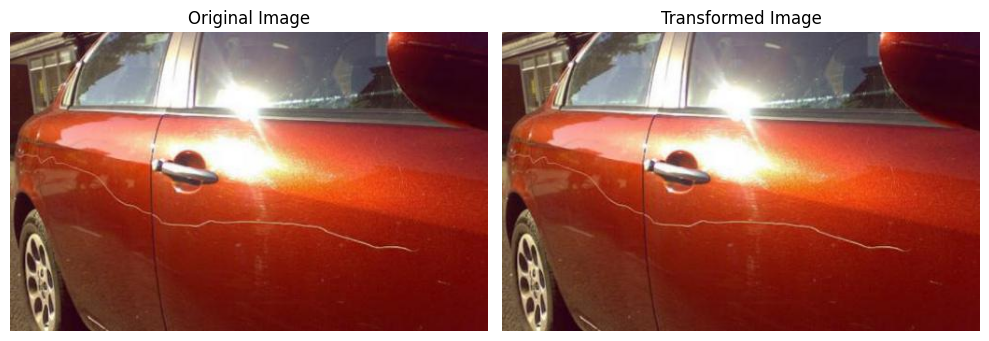

In [ ]:
transform1 = A.Compose([
    A.RandomBrightnessContrast(brightness_limit=0.8, contrast_limit=0.8),
])

transformed_img1 = transform1(image=img)['image']

display_images_side_by_side(img, transformed_img1)

#2) RandomGamma

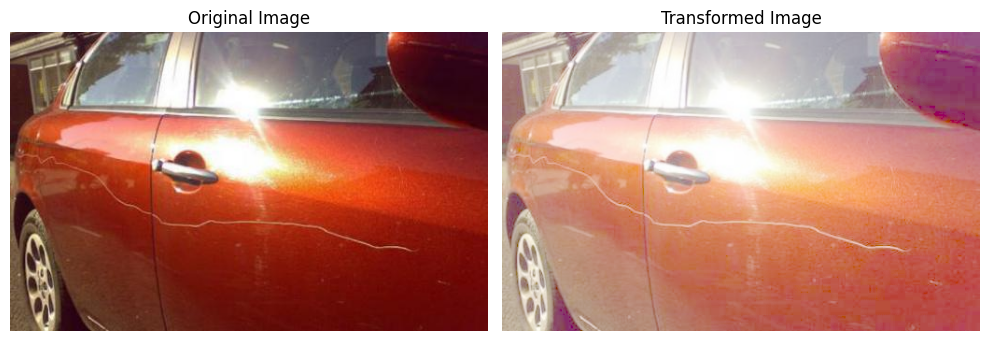

In [ ]:
transform2 = A.Compose([
    A.RandomGamma(gamma_limit=(60), p=1.0),
])
transformed_img2 = transform2(image=img)['image']

display_images_side_by_side(img, transformed_img2)

#3) CLAHE (Contrast Limited Adaptive Histogram Equalization)

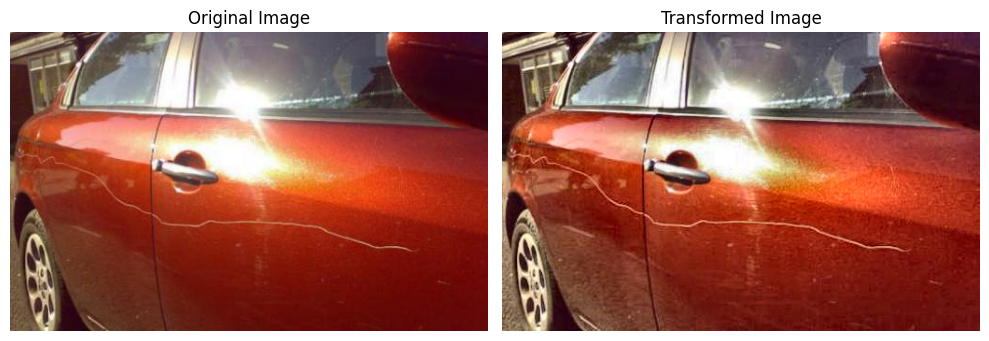

In [ ]:
transform3 = A.CLAHE(clip_limit=3.0, tile_grid_size=(8, 8), p=1.0)

transformed_img3 = transform3(image=img)['image']

display_images_side_by_side(img, transformed_img3)

#4) Equalize (Histogram Equalization)

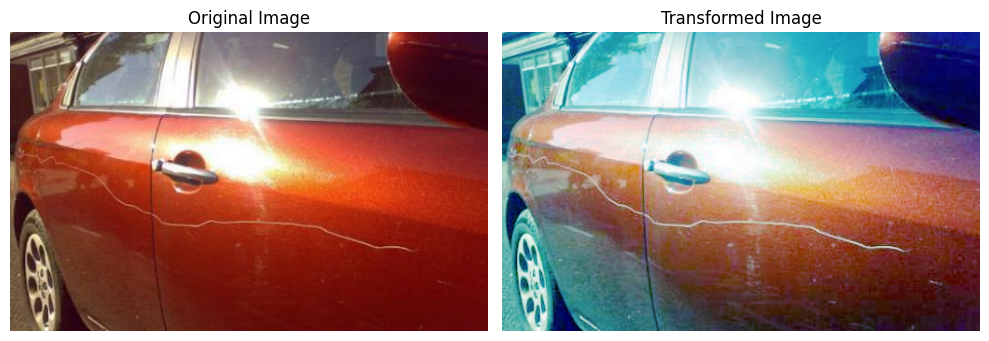

In [ ]:
transform4 = A.Equalize(p=1.0)

transformed_img4 = transform4(image=img)['image']

display_images_side_by_side(img, transformed_img4)



#5) Gaussian Noise

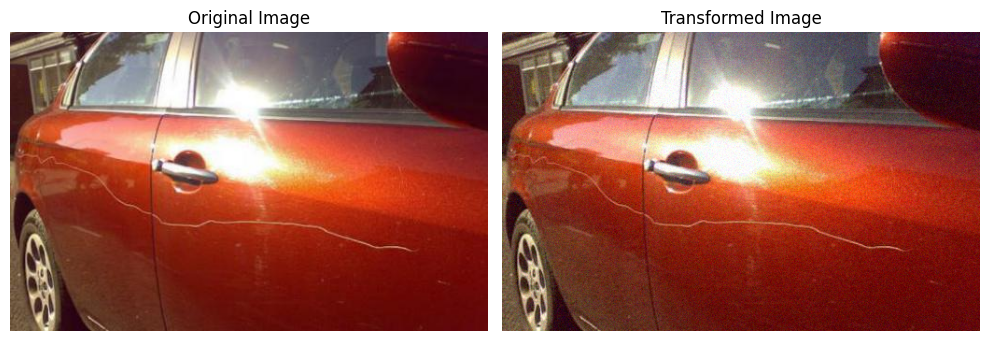

In [ ]:
transform5 = A.GaussNoise(var_limit=(70.0, 100.0), mean=0.5, p=1)

transformed_img5 = transform5(image=img)['image']

display_images_side_by_side(img, transformed_img5)

#6) Gaussian Blur

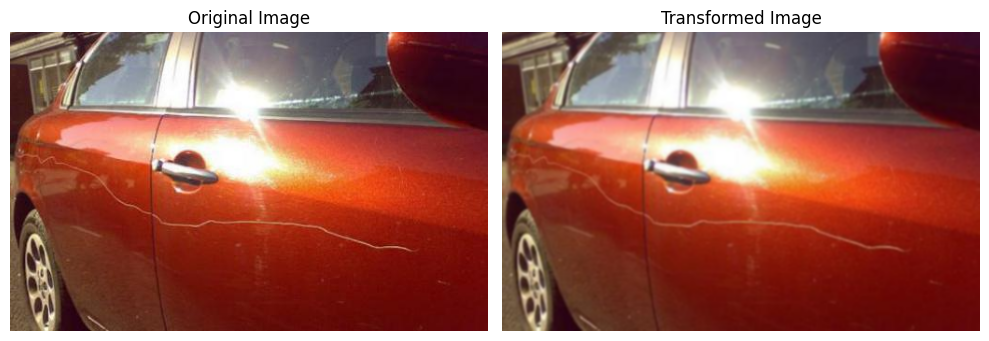

In [ ]:
transform6 = A.GaussianBlur(blur_limit=(3, 7), p=1.0)

transformed_img6 = transform6(image=img)['image']

display_images_side_by_side(img, transformed_img6)

#7) Median Blur

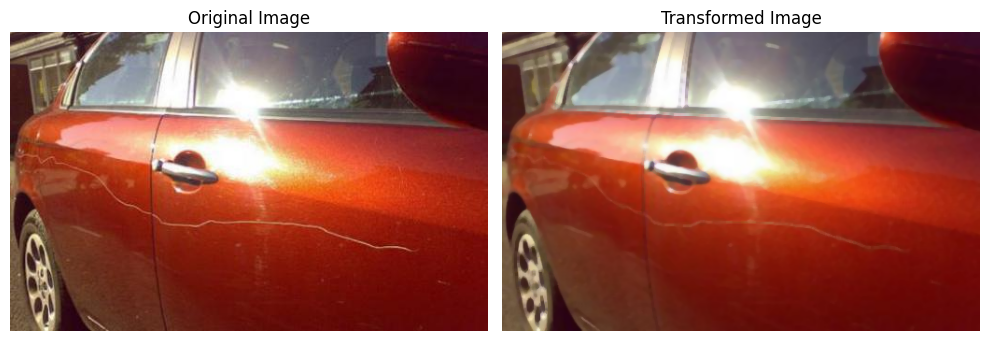

In [ ]:
transform7 = A.MedianBlur (blur_limit=7, always_apply=False, p=0.5)

transformed_img7 = transform7(image=img)['image']

display_images_side_by_side(img, transformed_img7)

#8) ColorJitter

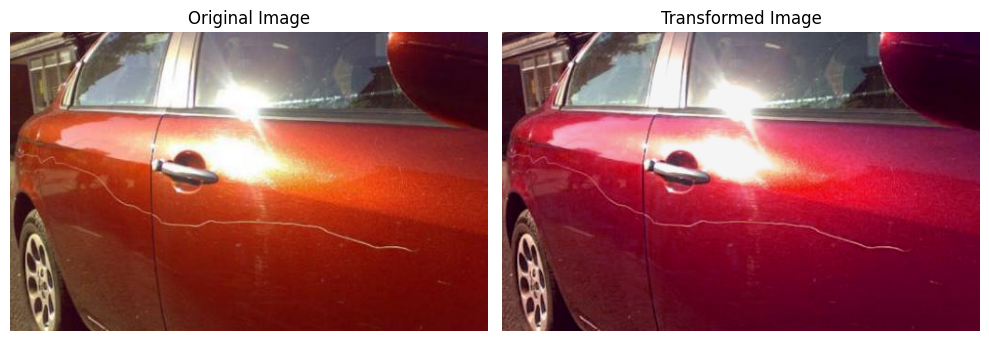

In [ ]:
transform8 = A.ColorJitter(
    brightness=0.2,  
    contrast=0.2,  
    saturation=0.2,  
    hue=0.2, 
    always_apply=True
)

transformed_img8 = transform8(image=img)['image']

display_images_side_by_side(img, transformed_img8)

#9) Sharpen

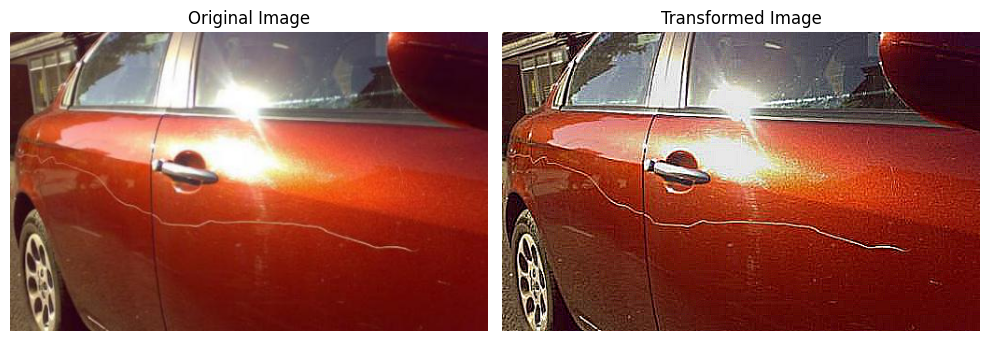

In [ ]:
transform9 = A.Sharpen (alpha=(0.5, 1.0), lightness=(0.5, 1.0), p=1)

transformed_img9 = transform9(image=img)['image']

display_images_side_by_side(img, transformed_img9)

#10) HueSaturationValue

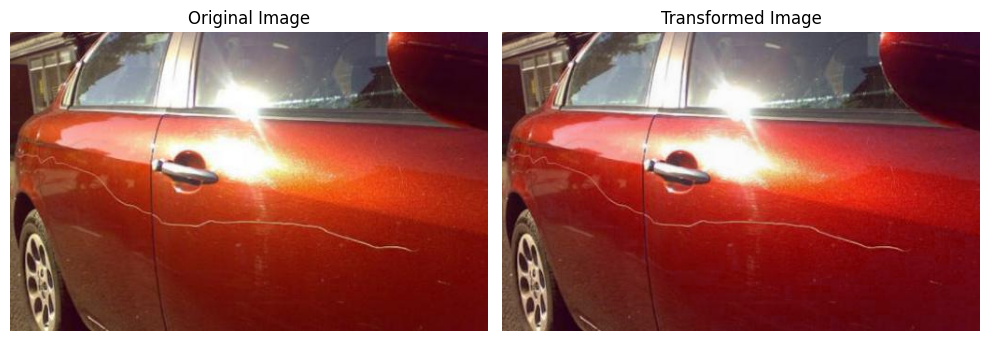

In [ ]:
transform10 = A.HueSaturationValue (hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=18, p=1)

transformed_img10 = transform10(image=img)['image']

display_images_side_by_side(img, transformed_img10)

#11) FancyPCA

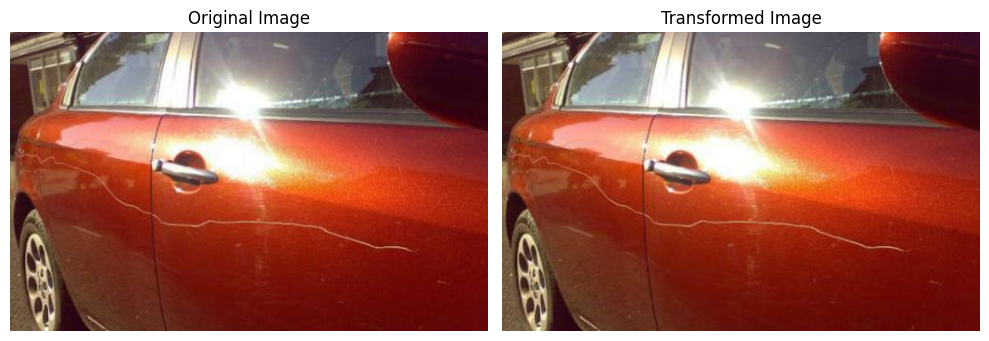

In [ ]:
transform11 = A.FancyPCA (alpha=0.1, p=1)

transformed_img11 = transform11(image=img)['image']

display_images_side_by_side(img, transformed_img11)

#12) Normalize

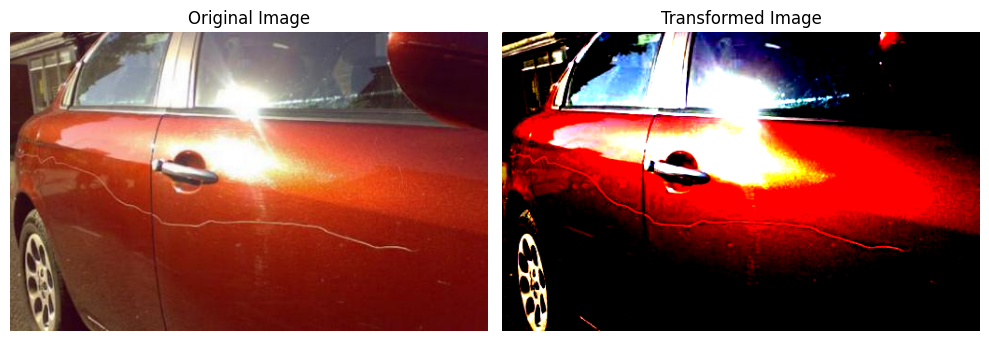

In [ ]:
transform12 = A.Normalize (mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225), max_pixel_value=255.0, p=1.0)

transformed_img12 = transform12(image=img)['image']

display_images_side_by_side(img, transformed_img12)

##Geometric Transformations

#13) Resize

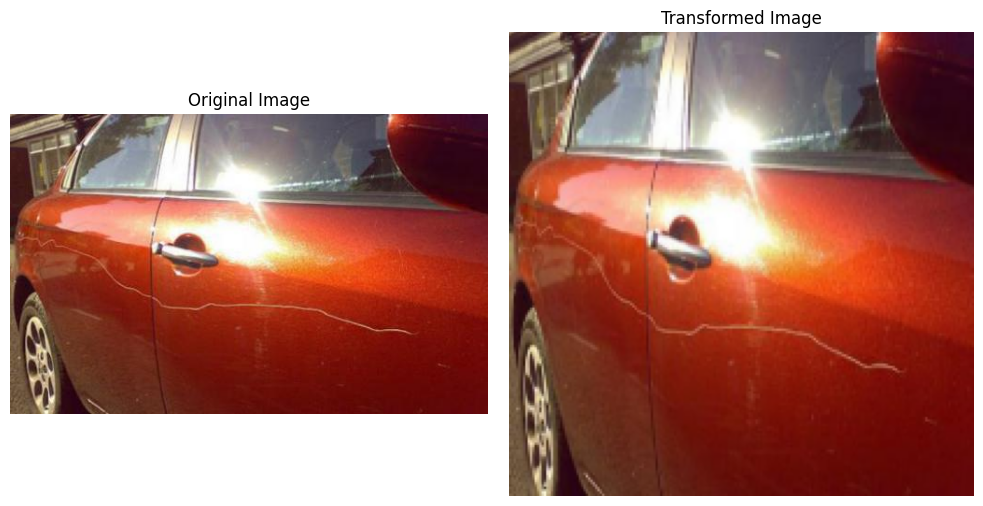

In [ ]:
transform13 =  A.Resize(height=200, width=200)

transformed_img13 = transform13(image=img)['image']

display_images_side_by_side(img, transformed_img13)

 #14) RandomCrop

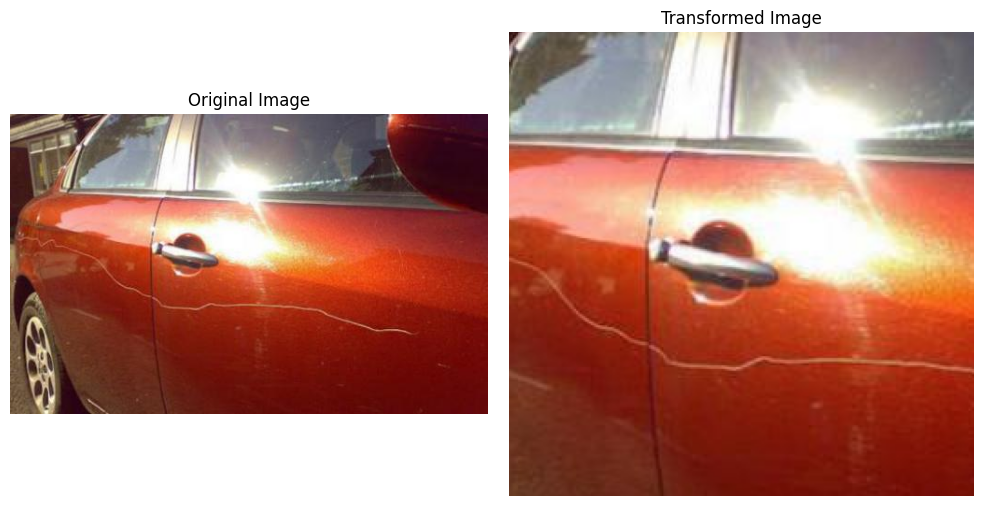

In [ ]:
transform14 = transform = A.RandomCrop(width=256, height=256)
transformed_img14 = transform14(image=img)['image']

display_images_side_by_side(img, transformed_img14)

#15) Affine Transform

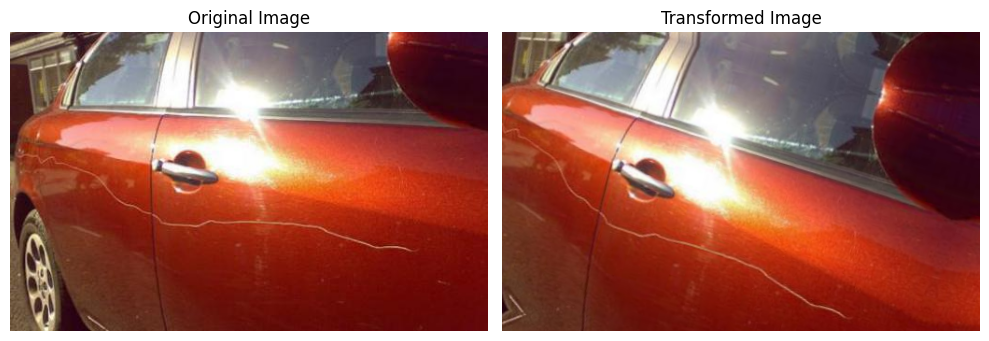

In [ ]:
transform15 = A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=20, p=0.7)

transformed_img15 = transform15(image=img)['image']

display_images_side_by_side(img, transformed_img15)


#16) CenterCrop

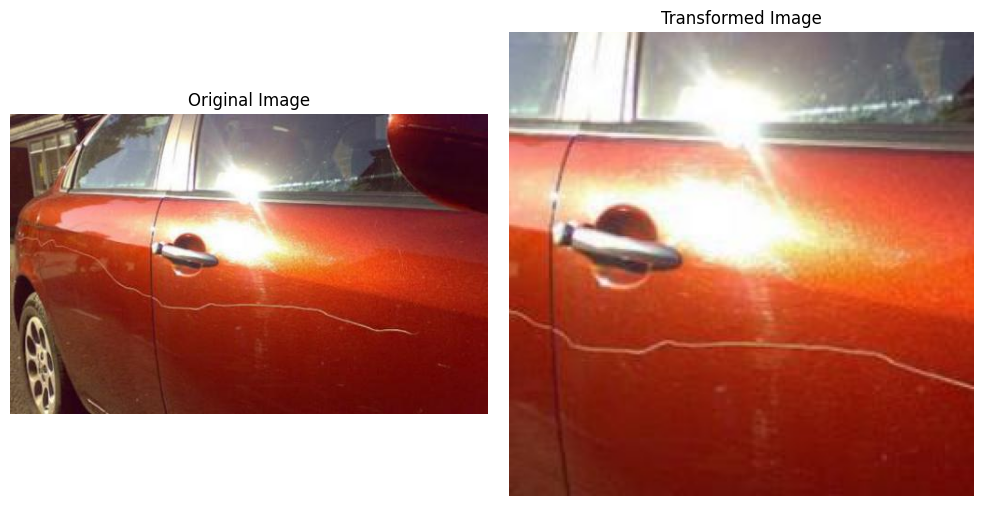

In [ ]:
transform16 = A.CenterCrop(height=256, width=256)

transformed_img16 = transform16(image=img)['image']

display_images_side_by_side(img, transformed_img16)

#17) Elastic Transform

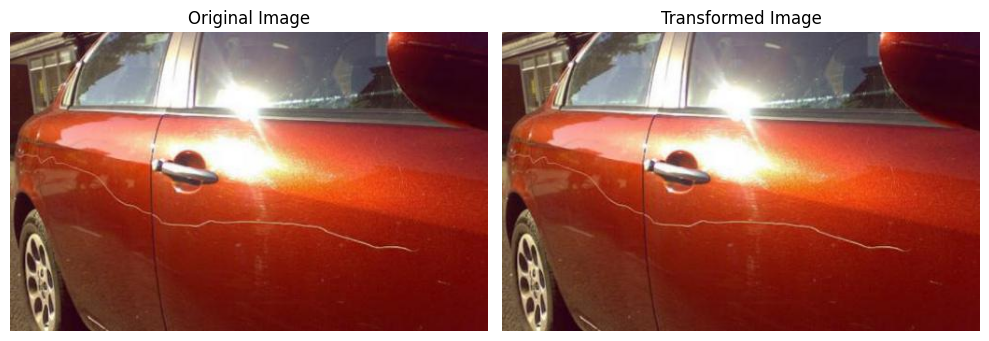

In [ ]:
transform17 = A.ElasticTransform(
    alpha=1,  
    sigma=50,  
    alpha_affine=30, 
    border_mode=cv2.BORDER_REFLECT_101,  
)

transformed_img17 = transform17(image=img)['image']

display_images_side_by_side(img, transformed_img17)

#18) Grid Distortion

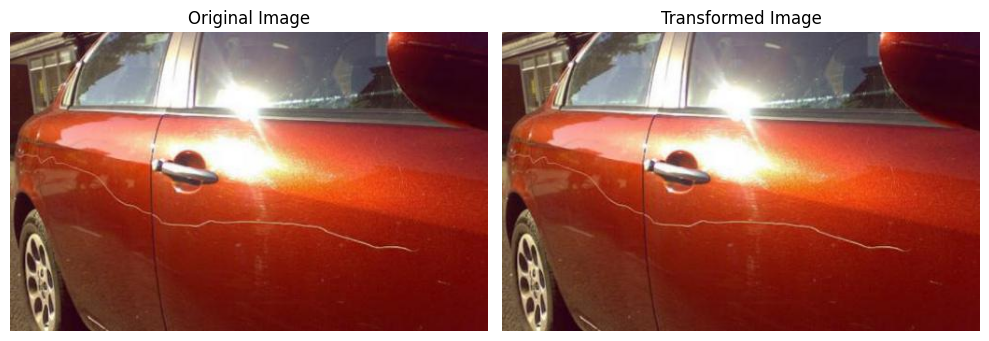

In [ ]:
transform18 = A.GridDistortion(
    num_steps=5,  # Number of distortions in each axis
    distort_limit=0.3,  # Strength of the distortion
    p=0.5  # Probability of applying the transformation
)

transformed_img18 = transform18(image=img)['image']

display_images_side_by_side(img, transformed_img18)

#19) CropAndPad

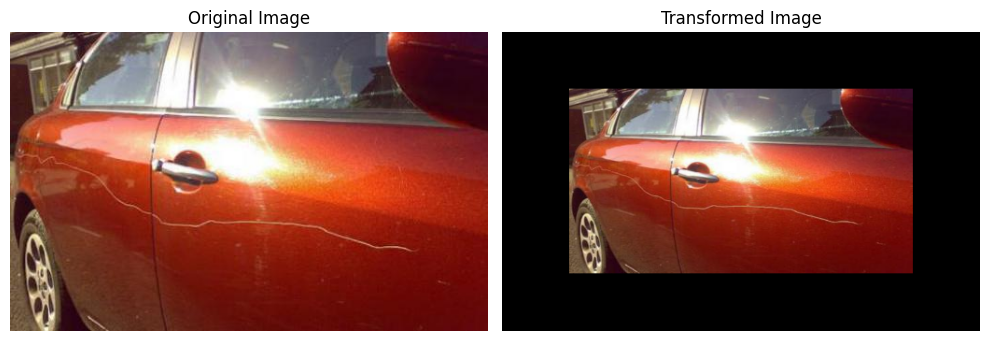

In [ ]:
transform19 = A.CropAndPad(px=100, keep_size=True)

transformed_img19 = transform19(image=img)['image']

display_images_side_by_side(img, transformed_img19)

In [ ]:
def visualize(image, bboxes):
    for bbox in bboxes:
        x_min, y_min, x_max, y_max = map(int, bbox[0:4]) 
        cv2.rectangle(image, (x_min, y_min), (x_max, y_max), (0, 0, 255), 2)
    plt.imshow(image)
    plt.show()

In [ ]:
image_path = '/content/drive/MyDrive/DamagedVehicleImages/train/images/slightly-scratch--78-_jpg.rf.486ddc2771fa2cd973bf8879e74a9fbe.jpg'
annotation_path = '/content/drive/MyDrive/DamagedVehicleImages/train/labels/slightly-scratch--78-_jpg.rf.486ddc2771fa2cd973bf8879e74a9fbe.txt'

def augment_image_with_bboxes(image_path, annotation_path,transform):

    # Load the image
  image = cv2.imread(image_path)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Read the annotations from the file
  bboxes = []
  with open(annotation_path, 'r') as f:
    annotations = f.readlines()

  for annotation in annotations:
    label, x, y, w, h = map(float, annotation.strip().split())
    # x_min = int((x - w / 2) * image.shape[1])
    # y_min = int((y - h / 2) * image.shape[0])
    # x_max = int((x + w / 2) * image.shape[1])
    # y_max = int((y + h / 2) * image.shape[0])
    x_min = ((x - w / 2) * image.shape[1])
    y_min = ((y - h / 2) * image.shape[0])
    x_max = ((x + w / 2) * image.shape[1])
    y_max = ((y + h / 2) * image.shape[0])
    bboxes.append([x_min, y_min, x_max, y_max,label])





    # Apply the augmentations
    augmented = transform(image=image, bboxes=bboxes)
    augmented_image = augmented['image']
    augmented_bboxes = augmented['bboxes']

    visualized_original = visualize(image.copy(), bboxes)
    visualized_augmented = visualize(augmented_image, augmented_bboxes)

In [ ]:
transformb = A.Compose([
    A.RandomCrop(width=200, height=200),
], bbox_params=A.BboxParams(format='pascal_voc'))

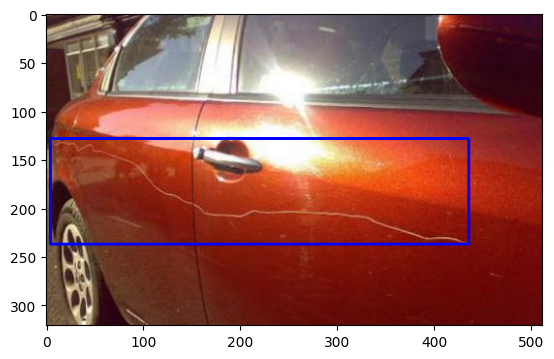

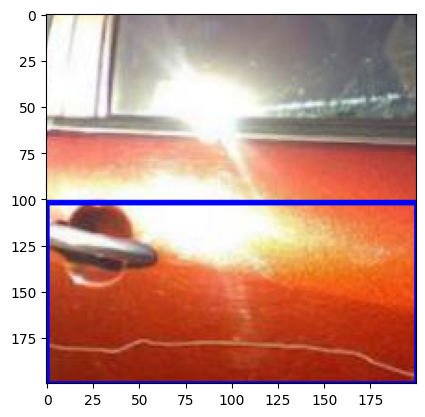

In [ ]:
augment_image_with_bboxes(image_path, annotation_path, transformb)